In [85]:
# Imports
import os
import cv2
import csv
import numpy as np
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify
import tensorflow as tf
from tensorflow.keras.models import load_model
from skimage.morphology import skeletonize
import networkx as nx
%matplotlib inline


In [86]:
# Model and paths

patch_size = 256
model_path = r'/Users/celinewu/Documents/GitHub/2024-25b-fai2-adsai-CelineWu231265/Retake/Model/1_celine_231265_unet_model_2_256px.h5'
test_folder = r'/Users/celinewu/Documents/GitHub/2024-25b-fai2-adsai-CelineWu231265/Kaggle(Retake)'
csv_path   = r'/Users/celinewu/Documents/GitHub/2024-25b-fai2-adsai-CelineWu231265/Retake/Submissions/sub18.csv'


In [87]:
# F1 metric
def f1(y_true, y_pred):
    def recall_m(y_true, y_pred):
        TP = tf.reduce_sum(tf.round(tf.clip_by_value(y_true * y_pred, 0, 1)))
        Positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true, 0, 1)))
        return TP / (Positives + tf.keras.backend.epsilon())
    def precision_m(y_true, y_pred):
        TP = tf.reduce_sum(tf.round(tf.clip_by_value(y_true * y_pred, 0, 1)))
        Pred_Positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_pred, 0, 1)))
        return TP / (Pred_Positives + tf.keras.backend.epsilon())
    p, r = precision_m(y_true, y_pred), recall_m(y_true, y_pred)
    return 2 * ((p * r) / (p + r + tf.keras.backend.epsilon()))

# Load model
model = load_model(model_path, custom_objects={"f1": f1}, compile=False)


In [88]:
# helpers
def padder(image, patch_size):
    h, w = image.shape[:2]
    hp = ((h // patch_size) + 1) * patch_size - h
    wp = ((w // patch_size) + 1) * patch_size - w
    t, b = int(hp / 2), hp - int(hp / 2)
    l, r = int(wp / 2), wp - int(wp / 2)
    padded = cv2.copyMakeBorder(image, t, b, l, r, cv2.BORDER_CONSTANT, value=0)
    return padded, (t, b, l, r)

def unpadder(image, pad):
    t, b, l, r = pad
    return image[t:image.shape[0]-b, l:image.shape[1]-r]

def cropper(image):
    orig_shape = image.shape
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(image, (11, 11), 0)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return image, {"original_shape": orig_shape, "used_crop": False}
    largest = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest)
    size = max(w, h)
    xc, yc = x + w // 2, y + h // 2
    xs, ys = max(0, xc - size // 2), max(0, yc - size // 2)
    cropped = image[ys:ys + size, xs:xs + size]
    return cropped, {"original_shape": orig_shape, "used_crop": True, "x_start": xs, "y_start": ys, "crop_size": size}

def uncropper(cropped_img, crop_info):
    canvas = np.zeros(crop_info["original_shape"][:2], dtype=cropped_img.dtype)
    if not crop_info.get("used_crop", False):
        return cropped_img
    xs, ys, size = crop_info["x_start"], crop_info["y_start"], crop_info["crop_size"]
    canvas[ys:ys + size, xs:xs + size] = cropped_img
    return canvas



Processing test_image_1.tif


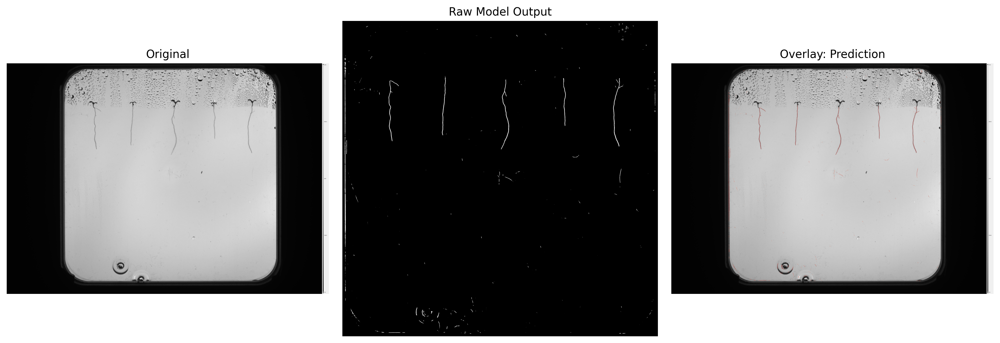


Processing test_image_10.tif


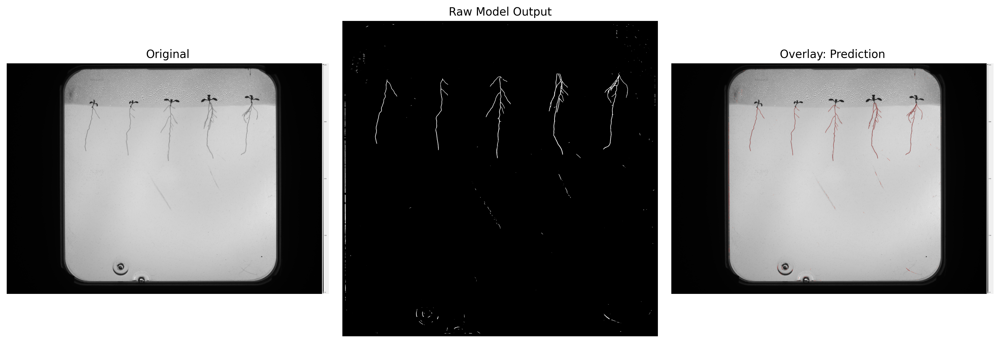


Processing test_image_11.tif


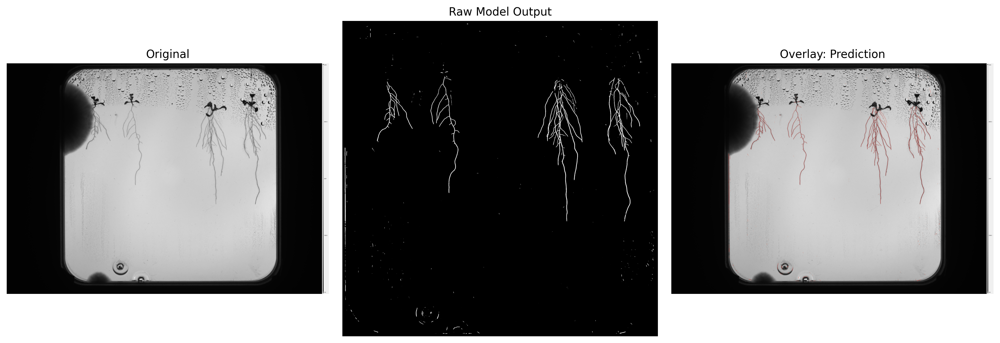


Processing test_image_2.tif


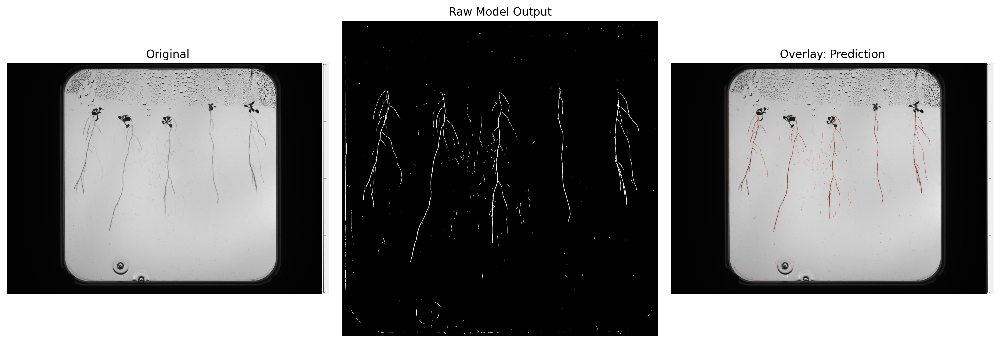


Processing test_image_3.tif


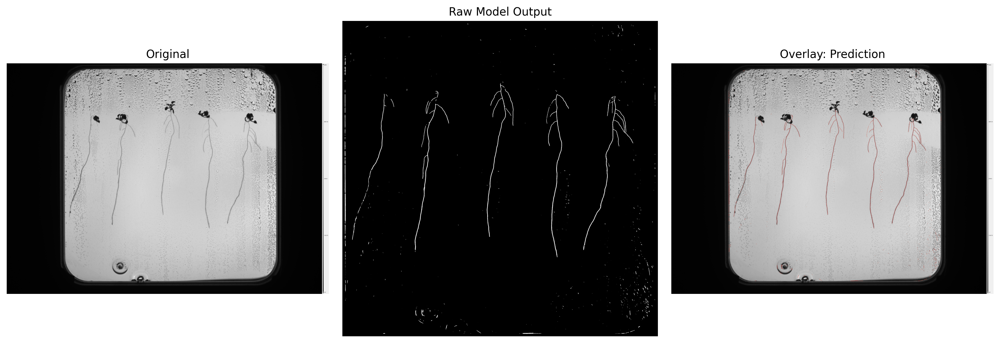


Processing test_image_4.tif


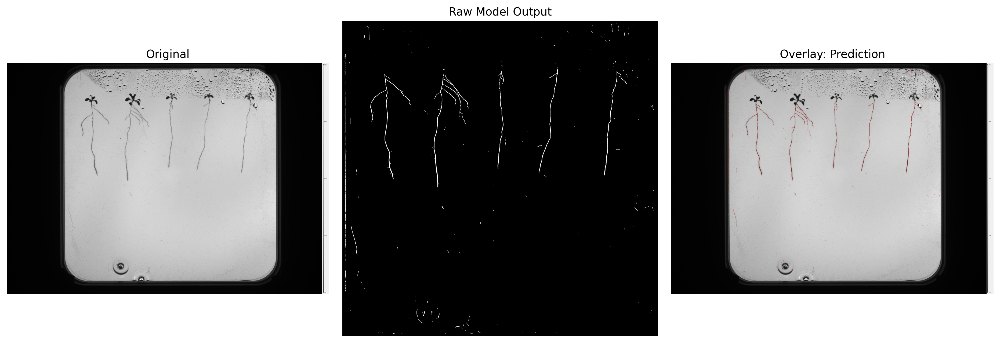


Processing test_image_5.tif


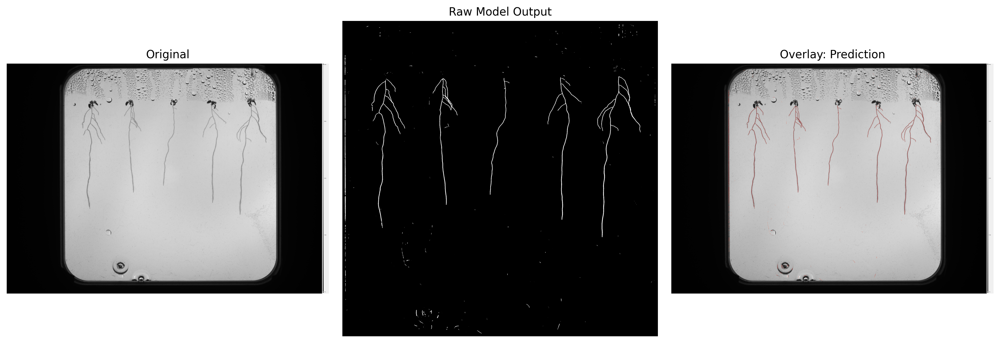


Processing test_image_6.tif


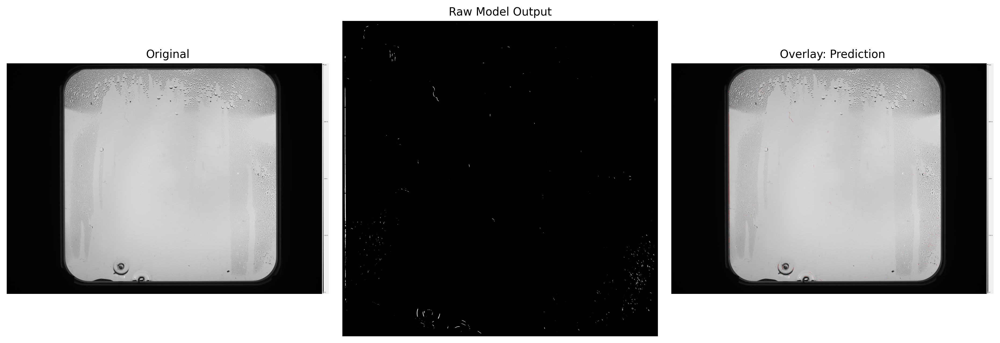


Processing test_image_7.tif


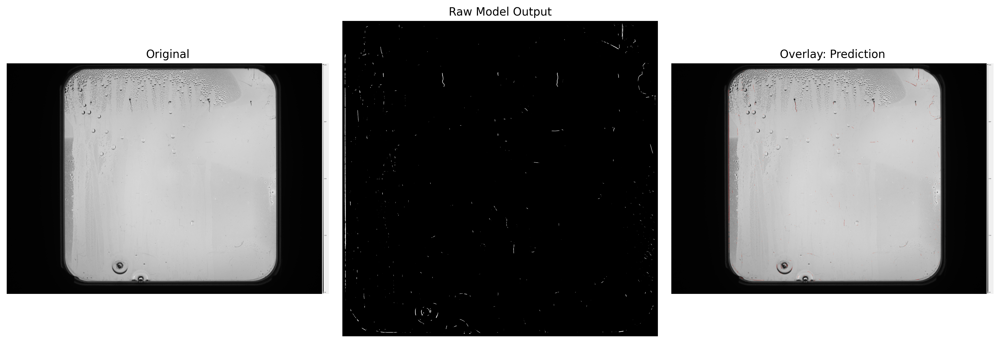


Processing test_image_8.tif


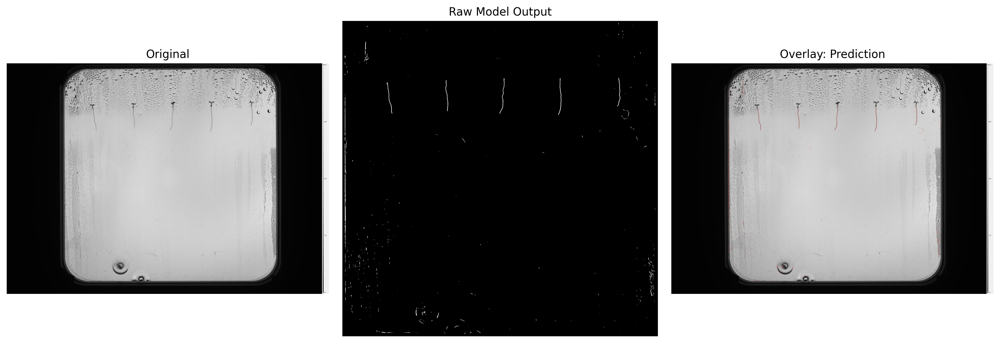


Processing test_image_9.tif


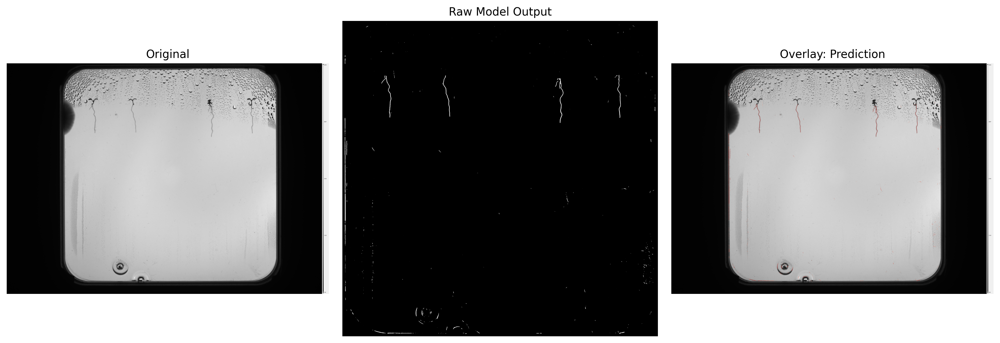

In [89]:
# Predict masks 
def predict_masks_raw(folder, model, patch_size=256):
    results = {}
    for fname in sorted(os.listdir(folder)):
        if not fname.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff')):
            continue
        print(f"\nProcessing {fname}")
        img_path = os.path.join(folder, fname)
        image = cv2.imread(img_path, 0)
        petri, crop_info = cropper(image)
        petri_pad, pad_info = padder(petri, patch_size)
        patches = patchify(petri_pad, (patch_size, patch_size), step=128)
        ph, pw = patches.shape[:2]
        patches_rgb = np.repeat(patches, 3, axis=-1)
        model_in = patches_rgb.reshape(-1, patch_size, patch_size, 3) / 255.0
        preds = model.predict(model_in, verbose=0)
        preds = preds.squeeze().reshape(ph, pw, patch_size, patch_size)
        mask_pred = unpatchify(preds, petri_pad.shape)
        mask_unpad = unpadder(mask_pred, pad_info)
        mask_full = uncropper(mask_unpad, crop_info)
        results[fname] = {'mask': mask_full, 'crop_info': crop_info}
        f, ax = plt.subplots(1, 3, figsize=(15, 5), dpi=250)
        ax[0].imshow(image, cmap='gray'); ax[0].set_title("Original"); ax[0].axis('off')
        ax[1].imshow(mask_pred, cmap='gray'); ax[1].set_title("Raw Model Output"); ax[1].axis('off')
        ax[2].imshow(image, cmap='gray')
        ax[2].imshow(mask_full, cmap='Reds', alpha=(mask_full > 0.1) * 0.6)
        ax[2].set_title("Overlay: Prediction"); ax[2].axis('off')
        plt.tight_layout(); plt.show()
    return results

raw_predictions = predict_masks_raw(test_folder, model, patch_size)


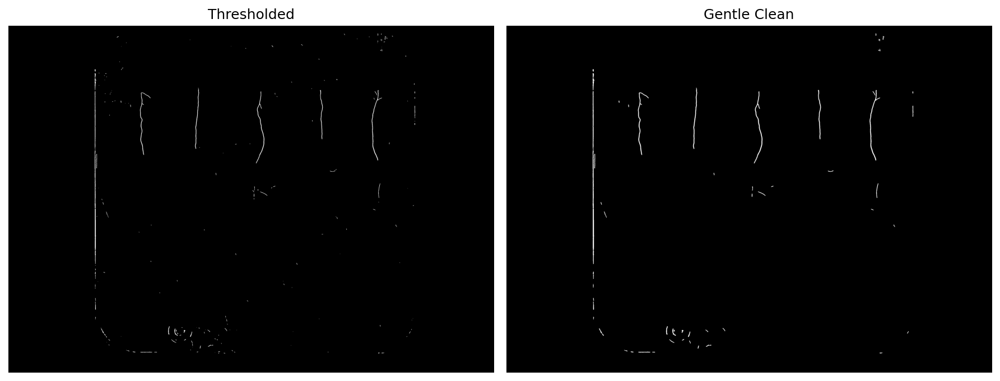

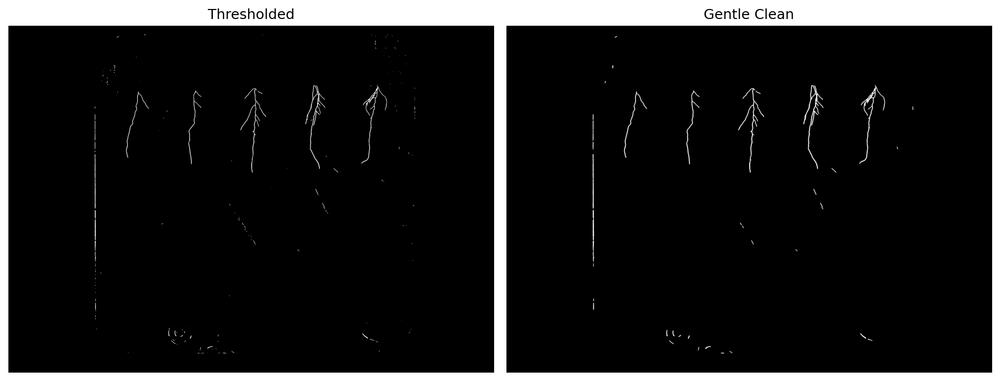

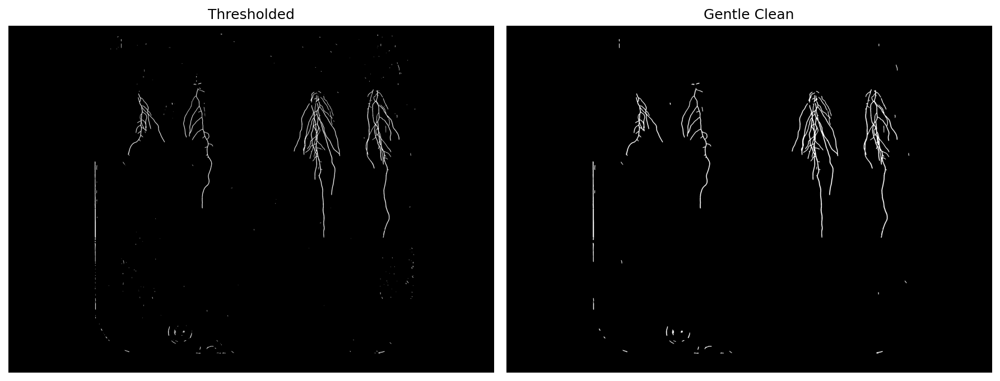

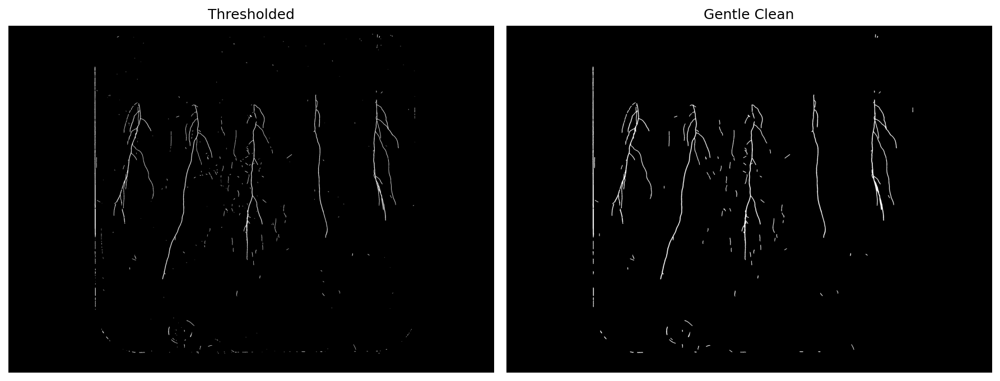

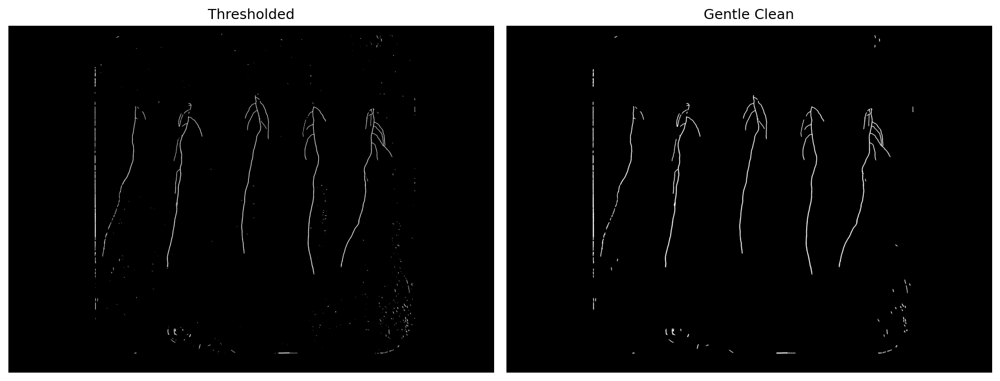

...

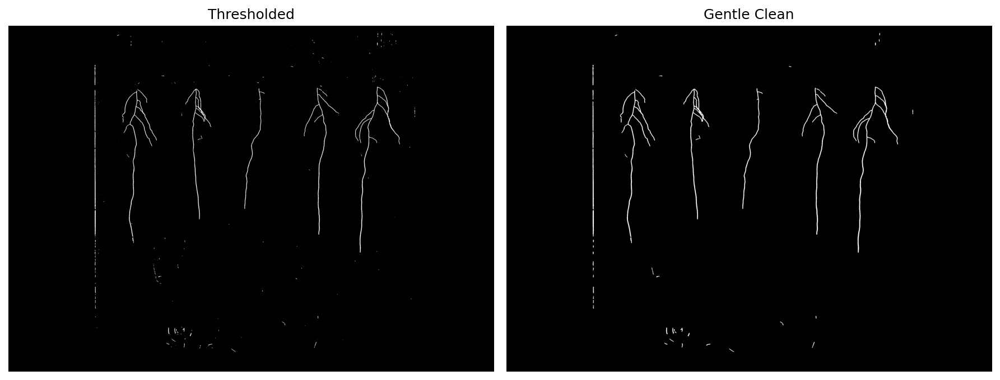

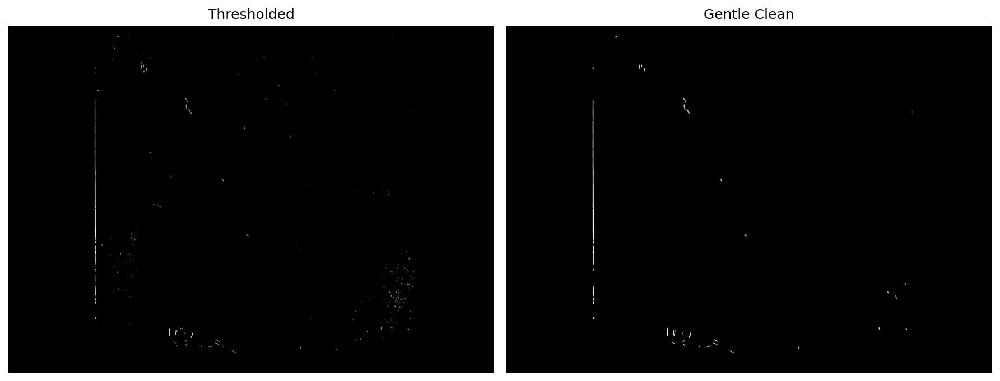

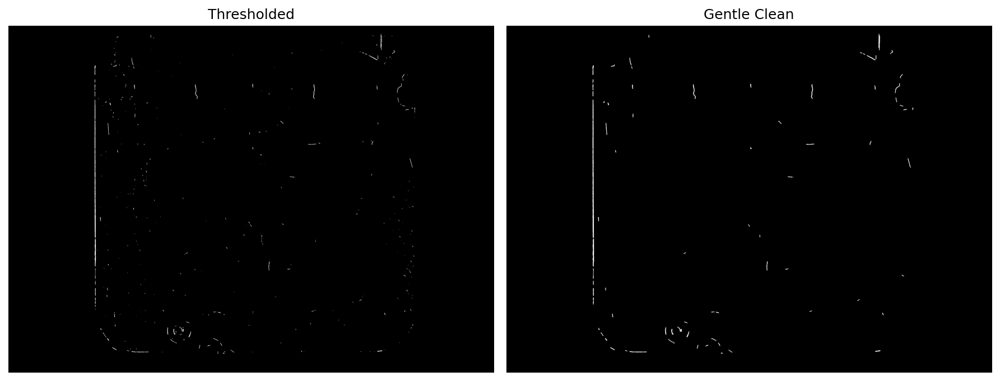

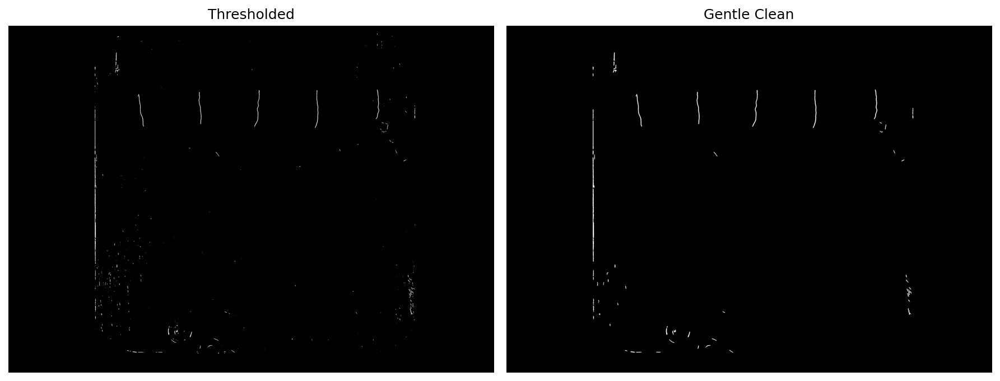

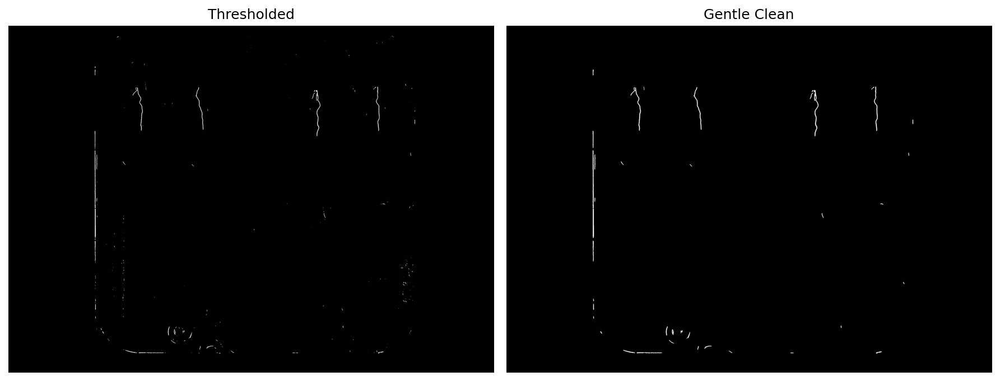

In [90]:
# Threshold + gentle morphological cleaning
threshold = 0.1
ks_open, ks_close = (3, 3), (3, 3)
it_open = 1
dilate_iterations = 2
erode_iterations = 1
min_area = 100
kernel_shape = cv2.MORPH_ELLIPSE

k_open = cv2.getStructuringElement(kernel_shape, ks_open)
k_close = cv2.getStructuringElement(kernel_shape, ks_close)
closed_masks = {}

for name, raw in raw_predictions.items():
    mask = (raw['mask'] > threshold).astype(np.uint8) * 255
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, k_open, iterations=it_open)
    dil = cv2.dilate(mask, k_close, iterations=dilate_iterations)
    closed = cv2.erode(dil, k_close, iterations=erode_iterations)
    labels, labmap, stats, _ = cv2.connectedComponentsWithStats((closed > 0).astype(np.uint8))
    keep = np.zeros_like(closed)
    for i in range(1, labels):
        if stats[i, cv2.CC_STAT_AREA] >= min_area:
            keep[labmap == i] = 255
    closed_masks[name] = keep
    plt.figure(figsize=(12, 5), dpi=150)
    plt.subplot(1, 2, 1); plt.imshow(mask, cmap='gray'); plt.title("Thresholded"); plt.axis('off')
    plt.subplot(1, 2, 2); plt.imshow(keep, cmap='gray'); plt.title("Gentle Clean"); plt.axis('off')
    plt.tight_layout(); plt.show()


In [91]:
# Crop and segment plants
top_crop_ratio = 0.15
num_plants = 5
min_area = 100
margin_edge = 50
aspect_ratio_threshold = 1.2
vertical_start_thresh_ratio = 0.25

dish_cropped_masks = {}
for name, closed in closed_masks.items():
    ci = raw_predictions[name]['crop_info']
    xs, size = ci['x_start'], ci['crop_size']
    xe = min(xs + size, closed.shape[1])
    horiz = closed[:, xs:xe]
    t = int(horiz.shape[0] * top_crop_ratio)
    dish_cropped_masks[name] = horiz[t:, :]

segmented_root_masks = {}
for name, mask in dish_cropped_masks.items():
    h, w = mask.shape
    band_w = w / num_plants
    n_lbl, lbl, stats, centroids = cv2.connectedComponentsWithStats(mask)
    pmasks = [np.zeros_like(mask, dtype=np.uint8) for _ in range(num_plants)]
    for i in range(1, n_lbl):
        x, y, cw, ch, area = stats[i]
        cx = centroids[i][0]
        if area < min_area or x < margin_edge or x + cw > w - margin_edge:
            continue
        ar = ch / cw if cw > 0 else 0
        if ar < aspect_ratio_threshold or y > int(h * vertical_start_thresh_ratio):
            continue
        idx = min(int(cx // band_w), num_plants - 1)
        comp = (lbl == i).astype(np.uint8)
        if np.count_nonzero(pmasks[idx]) < area:
            pmasks[idx] = comp
    segmented_root_masks[name] = [(m * 255).astype(np.uint8) for m in pmasks]


In [92]:
# Dijkstra root length calculation
final_root_masks = {}
for name, pmasks in segmented_root_masks.items():
    base = os.path.splitext(name)[0]
    for i, m in enumerate(pmasks):
        final_root_masks[f"{base}_plant_{i+1}"] = m

primary_root_lengths = {}
for key, m in final_root_masks.items():
    binary = (m > 0).astype(np.uint8)
    n_lbl, lbl, stats, _ = cv2.connectedComponentsWithStats(binary, connectivity=8)
    if n_lbl <= 1:
        primary_root_lengths[key] = 0.0
        continue
    largest = np.argmax(stats[1:, cv2.CC_STAT_AREA]) + 1
    comp = (lbl == largest).astype(np.uint8)
    skel = skeletonize(comp)
    if np.count_nonzero(skel) < 5:
        primary_root_lengths[key] = 0.0
        continue
    G = nx.Graph()
    coords = np.argwhere(skel)
    coord_set = set(map(tuple, coords))
    for y0, x0 in coords:
        for dy, dx in [(-1,0),(1,0),(0,-1),(0,1),(-1,-1),(-1,1),(1,-1),(1,1)]:
            nb = (y0+dy, x0+dx)
            if nb in coord_set:
                G.add_edge((y0,x0), nb, weight=np.hypot(dy,dx))
    if not G.nodes:
        primary_root_lengths[key] = 0.0
        continue
    top_node = min(G.nodes, key=lambda n: n[0])
    bottom_node = max(G.nodes, key=lambda n: n[0])
    try:
        plen = nx.dijkstra_path_length(G, top_node, bottom_node, weight='weight')
    except nx.NetworkXNoPath:
        plen = 0.0
    primary_root_lengths[key] = round(plen, 2)


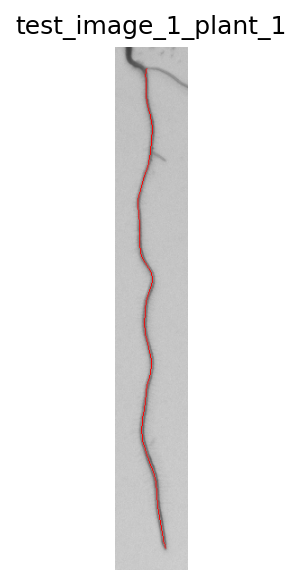

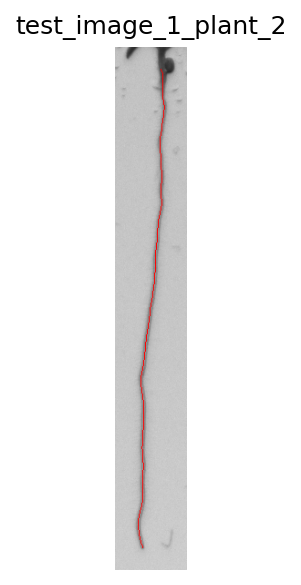

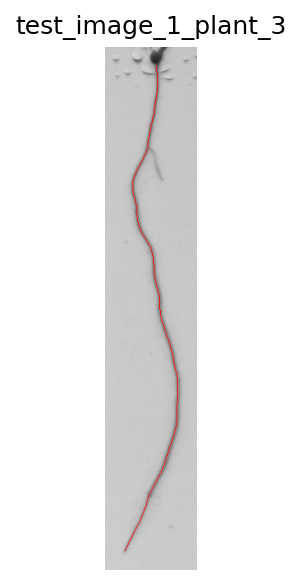

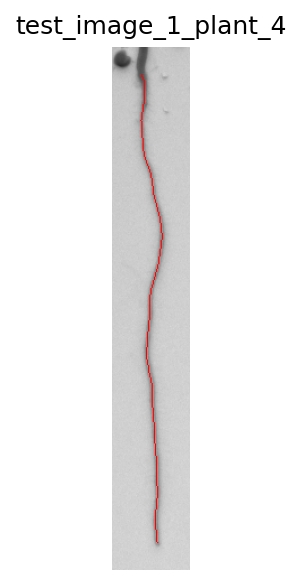

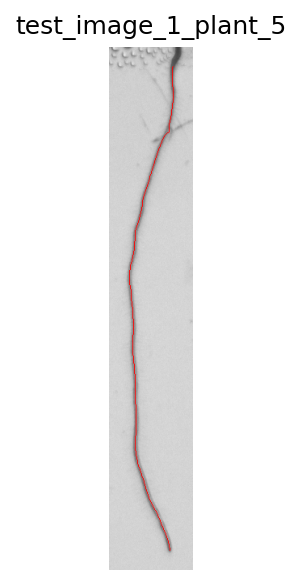

...

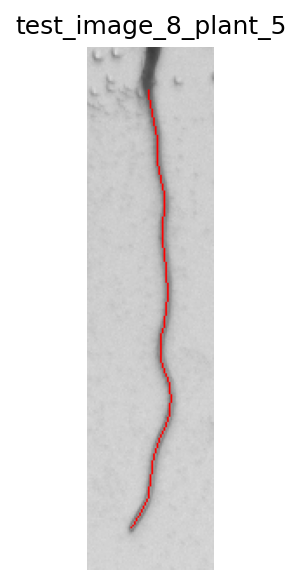

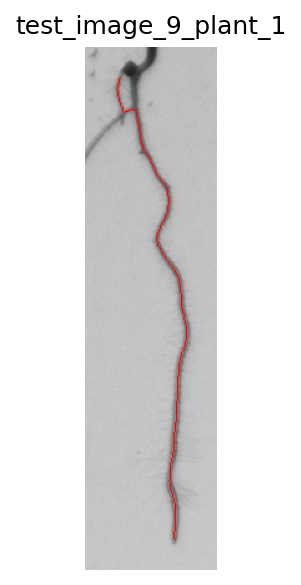

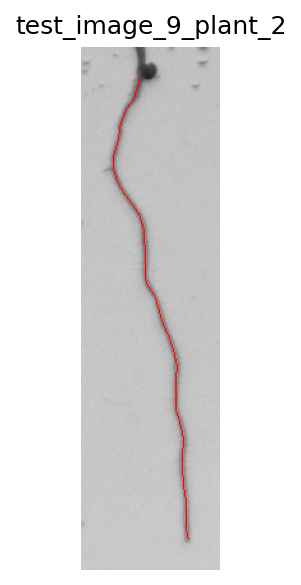

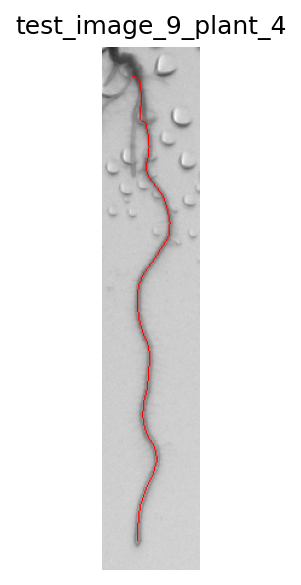

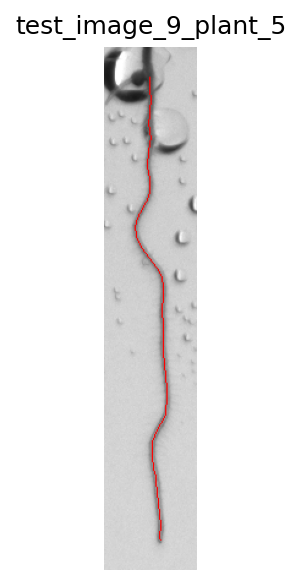

In [93]:
# Dijkstra path overlay visualization
orig_dir = test_folder
for key, m in final_root_masks.items():
    img_base = "_".join(key.split("_")[:-2]) + ".tif"
    img_path = os.path.join(orig_dir, img_base)
    rgb = cv2.imread(img_path)
    if rgb is None: continue
    rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
    ci = raw_predictions[img_base]["crop_info"]
    xs, size = ci["x_start"], ci["crop_size"]
    xe = min(xs + size, rgb.shape[1])
    rgb_crop = rgb[:, xs:xe]
    tc = int(rgb_crop.shape[0] * top_crop_ratio)
    rgb_final = rgb_crop[tc:, :]
    gray = cv2.cvtColor(rgb_final, cv2.COLOR_RGB2GRAY)
    overlay = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
    binary = (m > 0).astype(np.uint8)
    n_lbl, lbl, stats, _ = cv2.connectedComponentsWithStats(binary, connectivity=8)
    if n_lbl <= 1: continue
    largest = np.argmax(stats[1:, cv2.CC_STAT_AREA]) + 1
    comp = (lbl == largest).astype(np.uint8)
    skel = skeletonize(comp)
    coords = np.argwhere(skel)
    coord_set = set(map(tuple, coords))
    G = nx.Graph()
    for y0, x0 in coords:
        for dy, dx in [(-1,0),(1,0),(0,-1),(0,1),(-1,-1),(-1,1),(1,-1),(1,1)]:
            nb = (y0+dy, x0+dx)
            if nb in coord_set:
                G.add_edge((y0,x0), nb, weight=np.hypot(dy,dx))
    if not G.nodes: continue
    try:
        top_node = min(G.nodes, key=lambda n: n[0])
        bottom_node = max(G.nodes, key=lambda n: n[0])
        path = nx.dijkstra_path(G, top_node, bottom_node, weight='weight')
    except nx.NetworkXNoPath:
        continue
    pts = []
    for (yy, xx) in path:
        if 0 <= yy < overlay.shape[0] and 0 <= xx < overlay.shape[1]:
            overlay[yy, xx] = [255, 0, 0]
            pts.append((yy, xx))
    if not pts: continue
    pts = np.array(pts)
    y_min, x_min = pts.min(axis=0); y_max, x_max = pts.max(axis=0)
    mrg = 25
    y_min, y_max = max(y_min - mrg, 0), min(y_max + mrg, overlay.shape[0])
    x_min, x_max = max(x_min - mrg, 0), min(x_max + mrg, overlay.shape[1])
    crop_overlay = overlay[y_min:y_max, x_min:x_max]
    plt.figure(figsize=(4,4), dpi=150)
    plt.imshow(crop_overlay)
    plt.title(f"{key}")
    plt.axis('off'); plt.tight_layout(); plt.show()


In [94]:
# Export CSV
with open(csv_path, 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(["Plant ID", "Length (px)"])
    for pid, length in primary_root_lengths.items():
        writer.writerow([pid, length])
print(f"Saved primary root lengths to:\n{csv_path}")


Saved primary root lengths to:
/Users/celinewu/Documents/GitHub/2024-25b-fai2-adsai-CelineWu231265/Retake/Submissions/sub18.csv
